# Video Search with Azure Computer Vision 4 (Florence)
## 4 Search using an image or a prompt

![image](logo.jpg)

In [1]:
import datetime
import glob
import json
import os
import sys

from azure import (
    get_results_using_image,
    get_results_using_prompt,
    get_similar_images_using_prompt,
    remove_background,
    side_by_side_images,
    view_image,
)

from dotenv import load_dotenv
from PIL import Image

## 1. Informations

In [2]:
sys.version

'3.8.5 (default, Sep  4 2020, 07:30:14) \n[GCC 7.3.0]'

In [3]:
print("Today is", datetime.datetime.today())

Today is 2023-05-12 08:20:52.741127


## 2. Frames

In [4]:
IMAGES_DIR = "frames"

In [5]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: frames
Total number of catalog images = 1,448


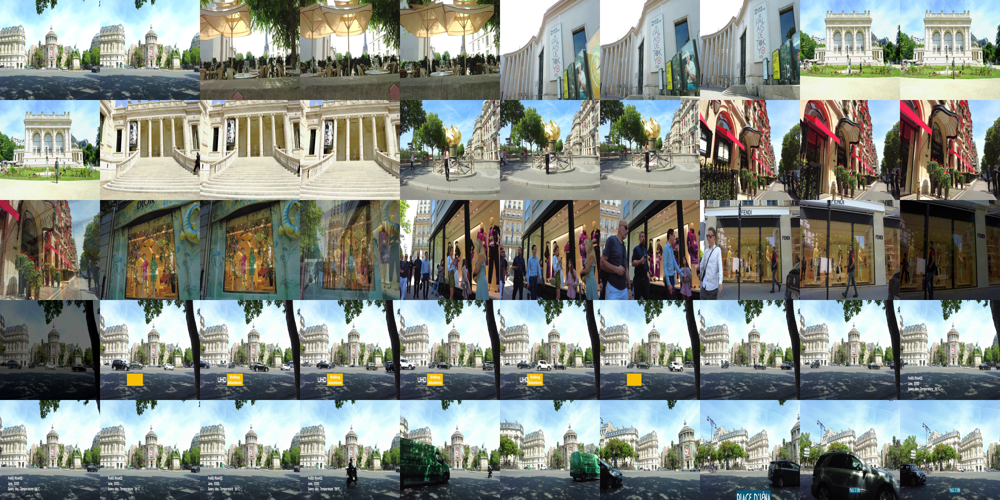

In [6]:
num_images_per_row = 10
num_images_per_col = 5

img_size = 200
start = 1
samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

for idx, image_file in enumerate(samples):
    img = Image.open(image_file)
    img = img.resize((img_size, img_size))
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

In [7]:
load_dotenv("azure.env")

key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

## 3. Loading vector embeddings

In [8]:
JSON_DIR = "json"

glob.glob(JSON_DIR + "/*.json")

['json/img_embed_12May2023_081536.json']

In [9]:
print("Importing vectors embeddings...")

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_12May2023_081536.json

Done: number of imported vector embeddings = 1,448


## 4. Visual search using a field image

We can use a reference image and find the most similar images.
In this demo we will use the reference image without its background
(Azure Computer Vision 4 can automatically remove the background). 
The search will be made using the image without its background.

In [10]:
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Total number of catalog images = 1,448


In [11]:
TEST_DIR = "images"

test_images = glob.glob(f"{TEST_DIR}/*")
print(f"Total number of test images = {len(test_images)}")

Total number of test images = 10


### Test 1

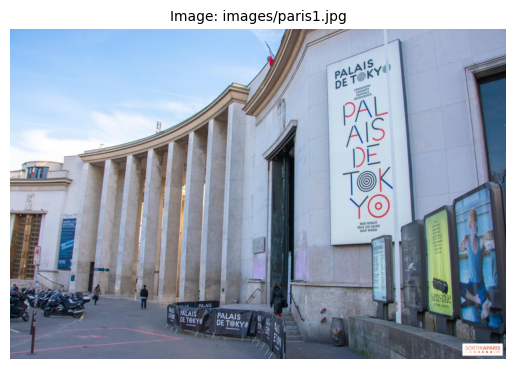

In [12]:
reference_image = test_images[0]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


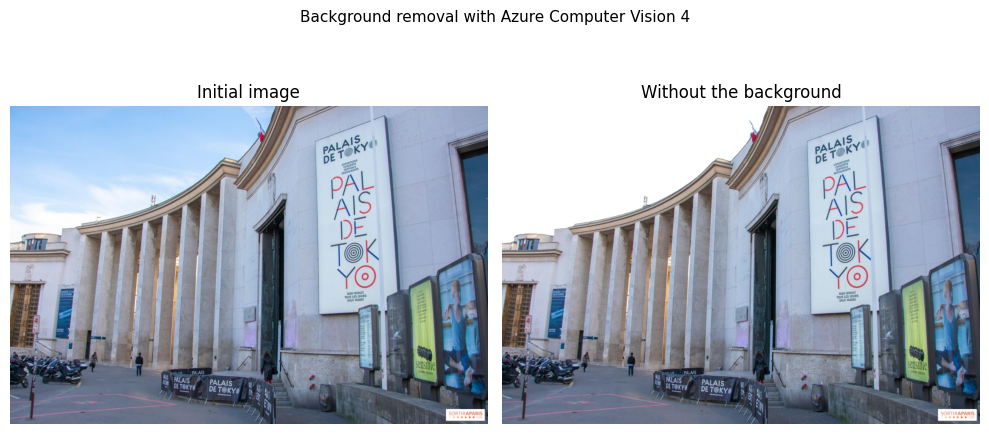

In [13]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_000000009.jpg with similarity index = 0.8299614247359112
002 frames/frame_000000203.jpg with similarity index = 0.8265645650629428
003 frames/frame_000000204.jpg with similarity index = 0.8034140281861117
004 frames/frame_000000206.jpg with similarity index = 0.797985209379603
005 frames/frame_000000205.jpg with similarity index = 0.7944256504763018
006 frames/frame_000000202.jpg with similarity index = 0.7930550570940439


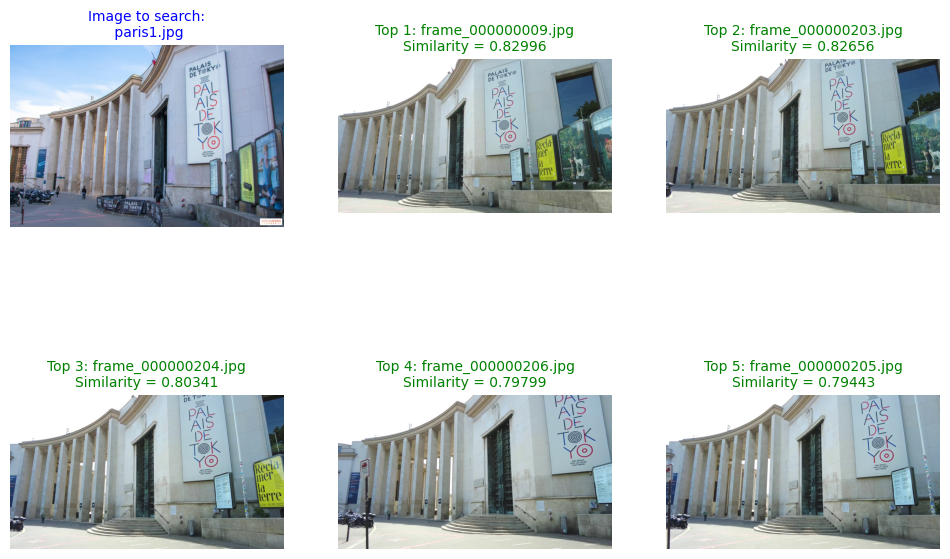

 2023-05-12 08:21:18 Powered by Azure Computer Vision Florence


,image_file,similarity
8,frames/frame_000000009.jpg,0.829961
202,frames/frame_000000203.jpg,0.826565
203,frames/frame_000000204.jpg,0.803414
205,frames/frame_000000206.jpg,0.797985
204,frames/frame_000000205.jpg,0.794426
...,...,...
807,frames/frame_000000808.jpg,0.286965
1292,frames/frame_000001293.jpg,0.285655
1133,frames/frame_000001134.jpg,0.283572
1288,frames/frame_000001289.jpg,0.282989


In [14]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 2

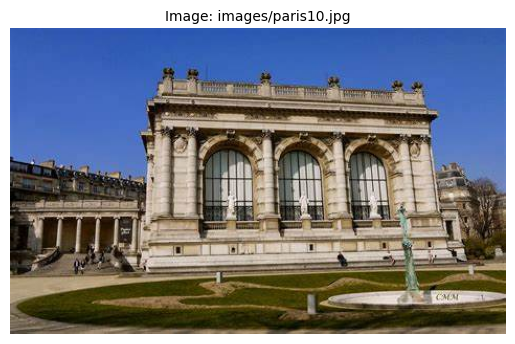

In [15]:
reference_image = test_images[1]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


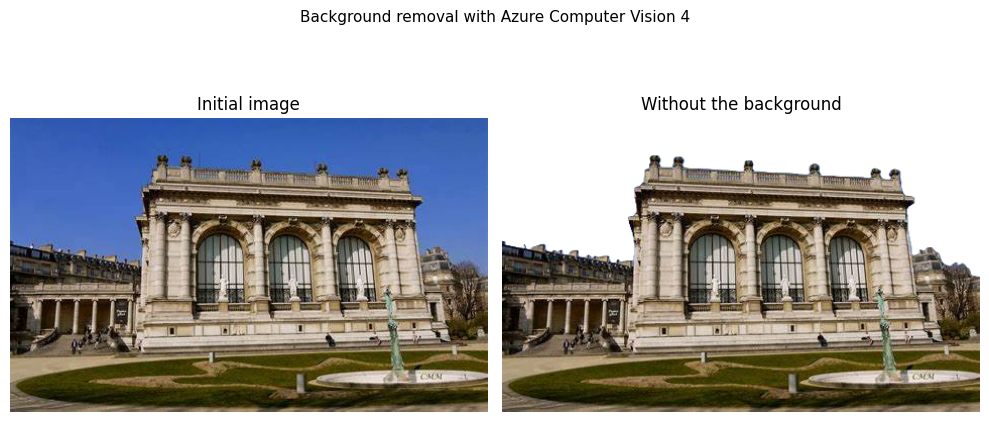

In [16]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_000000628.jpg with similarity index = 0.8665994864100118
002 frames/frame_000000361.jpg with similarity index = 0.8538767479975339
003 frames/frame_000000362.jpg with similarity index = 0.8535786778583515
004 frames/frame_000000337.jpg with similarity index = 0.8530307915294141
005 frames/frame_000000601.jpg with similarity index = 0.8528165535684522
006 frames/frame_000000352.jpg with similarity index = 0.8526032797945015


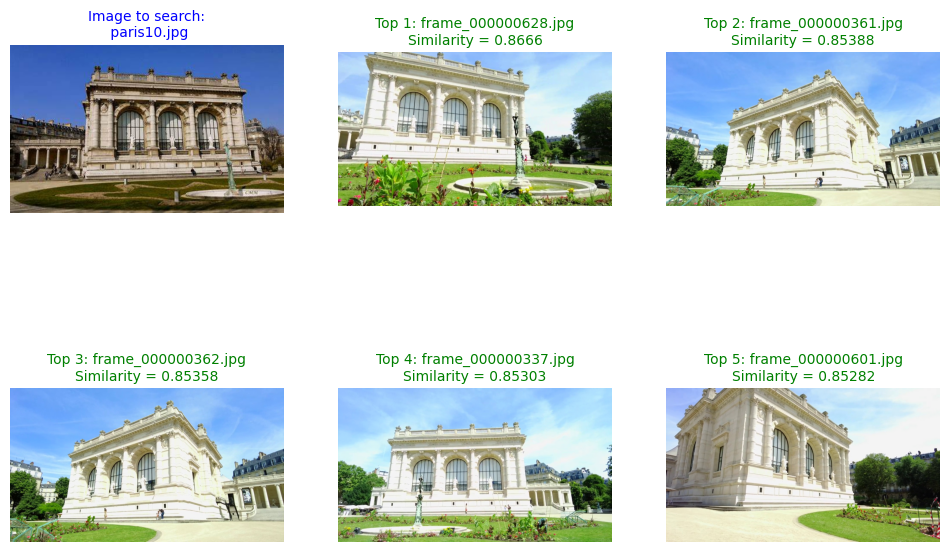

 2023-05-12 08:21:23 Powered by Azure Computer Vision Florence


,image_file,similarity
627,frames/frame_000000628.jpg,0.866599
360,frames/frame_000000361.jpg,0.853877
361,frames/frame_000000362.jpg,0.853579
336,frames/frame_000000337.jpg,0.853031
600,frames/frame_000000601.jpg,0.852817
...,...,...
1294,frames/frame_000001295.jpg,0.275596
1291,frames/frame_000001292.jpg,0.269589
836,frames/frame_000000837.jpg,0.265122
1288,frames/frame_000001289.jpg,0.252525


In [17]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 3

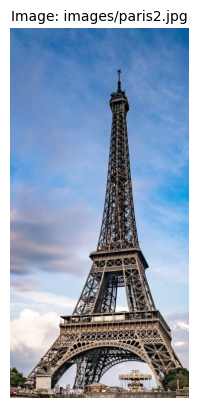

In [18]:
reference_image = test_images[2]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


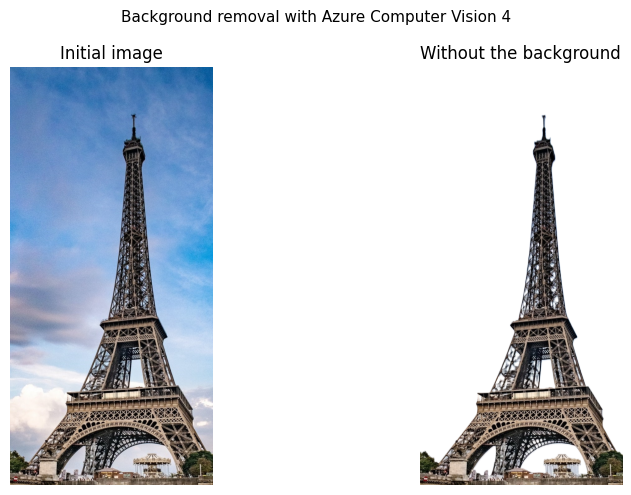

In [19]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_000000488.jpg with similarity index = 0.6223202849731929
002 frames/frame_000000505.jpg with similarity index = 0.6204686051987215
003 frames/frame_000000718.jpg with similarity index = 0.6170516723597094
004 frames/frame_000000487.jpg with similarity index = 0.6161220189411933
005 frames/frame_000000465.jpg with similarity index = 0.6080648355657378
006 frames/frame_000000004.jpg with similarity index = 0.5993384903222544


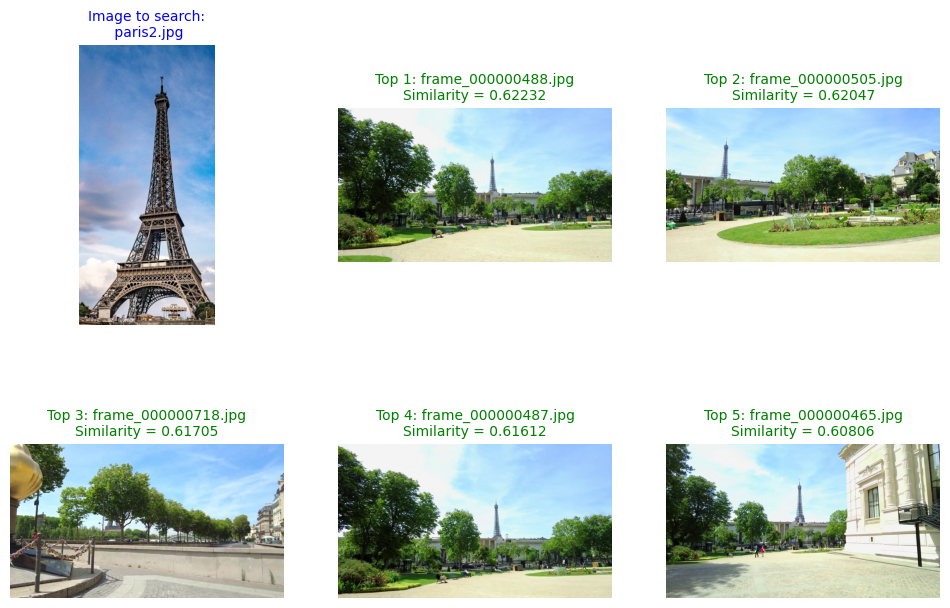

 2023-05-12 08:21:32 Powered by Azure Computer Vision Florence


,image_file,similarity
487,frames/frame_000000488.jpg,0.622320
504,frames/frame_000000505.jpg,0.620469
717,frames/frame_000000718.jpg,0.617052
486,frames/frame_000000487.jpg,0.616122
464,frames/frame_000000465.jpg,0.608065
...,...,...
915,frames/frame_000000916.jpg,0.256729
297,frames/frame_000000298.jpg,0.254997
1122,frames/frame_000001123.jpg,0.254844
7,frames/frame_000000008.jpg,0.254737


In [20]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 4

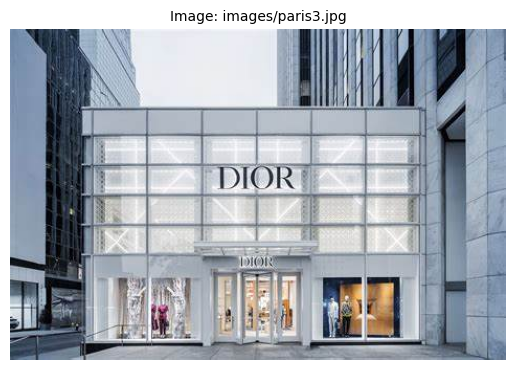

In [21]:
reference_image = test_images[3]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


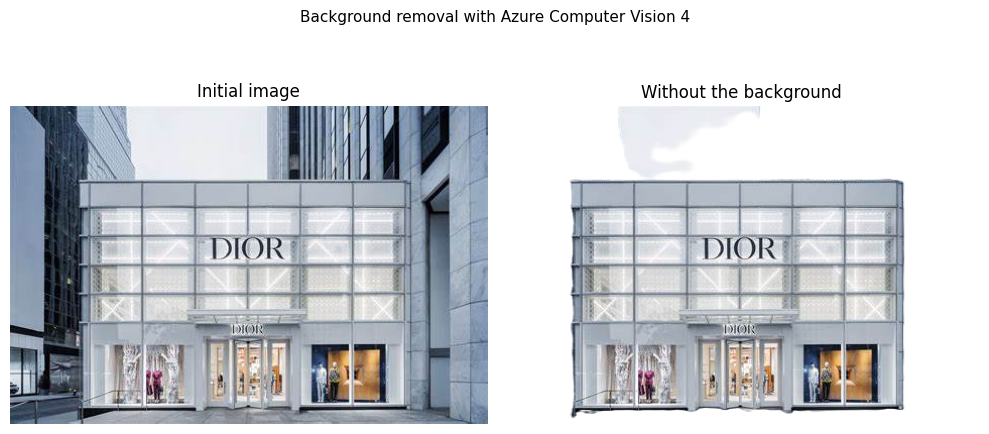

In [22]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_000001177.jpg with similarity index = 0.793755072745864
002 frames/frame_000001171.jpg with similarity index = 0.7717796656075653
003 frames/frame_000001176.jpg with similarity index = 0.7548418374978058
004 frames/frame_000001182.jpg with similarity index = 0.7547654432776514
005 frames/frame_000001175.jpg with similarity index = 0.7538279389763586
006 frames/frame_000001178.jpg with similarity index = 0.7489165199391292


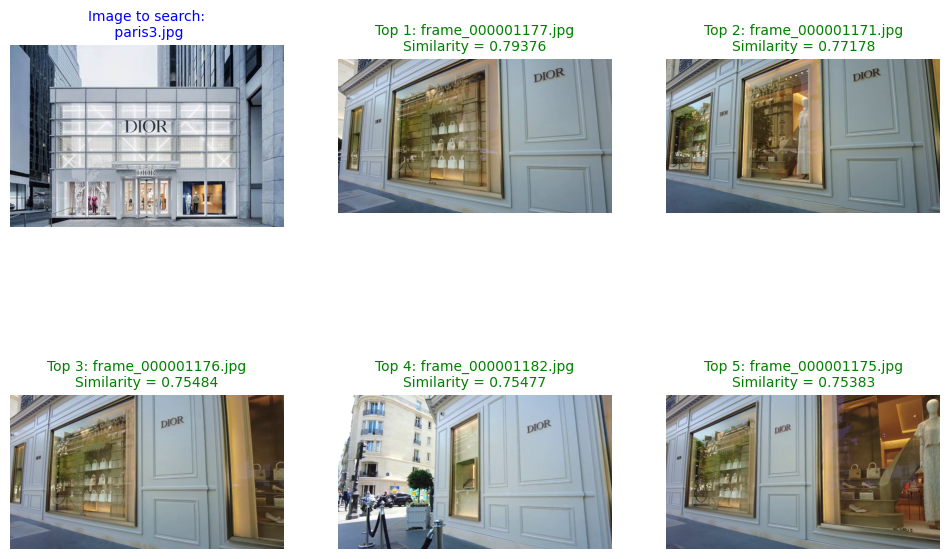

 2023-05-12 08:21:37 Powered by Azure Computer Vision Florence


,image_file,similarity
1176,frames/frame_000001177.jpg,0.793755
1170,frames/frame_000001171.jpg,0.771780
1175,frames/frame_000001176.jpg,0.754842
1181,frames/frame_000001182.jpg,0.754765
1174,frames/frame_000001175.jpg,0.753828
...,...,...
714,frames/frame_000000715.jpg,0.223870
696,frames/frame_000000697.jpg,0.222970
745,frames/frame_000000746.jpg,0.221376
421,frames/frame_000000422.jpg,0.218435


In [23]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 5

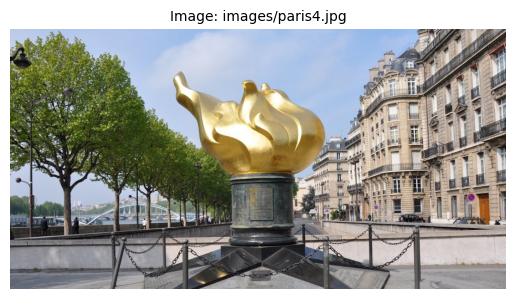

In [24]:
reference_image = test_images[4]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


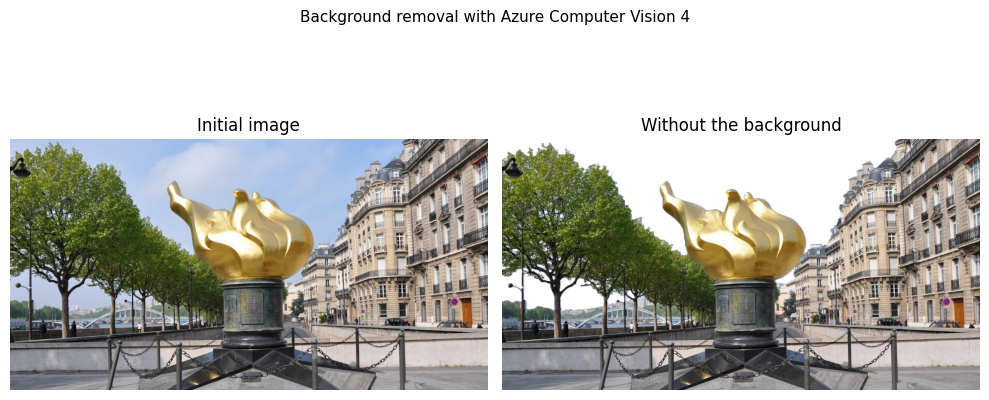

In [25]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 3 images:

001 frames/frame_000000678.jpg with similarity index = 0.8301167121912346
002 frames/frame_000000712.jpg with similarity index = 0.8261843685172408
003 frames/frame_000000018.jpg with similarity index = 0.8209494261310532


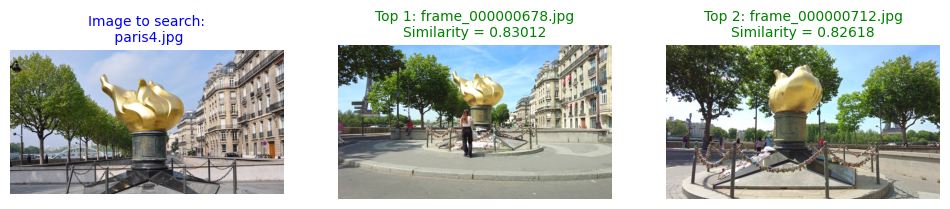

 2023-05-12 08:21:44 Powered by Azure Computer Vision Florence


,image_file,similarity
677,frames/frame_000000678.jpg,0.830117
711,frames/frame_000000712.jpg,0.826184
17,frames/frame_000000018.jpg,0.820949
702,frames/frame_000000703.jpg,0.820750
678,frames/frame_000000679.jpg,0.816229
...,...,...
1329,frames/frame_000001330.jpg,0.312414
1120,frames/frame_000001121.jpg,0.310602
1332,frames/frame_000001333.jpg,0.308408
1288,frames/frame_000001289.jpg,0.300445


In [26]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=3, disp=True
)

## 5. Visual search using some text

We can use some prompt (text) to find some articles in our catalog images.

### Test 1

In [27]:
query = "person wearing a mask"


Similar images using query = person wearing a mask


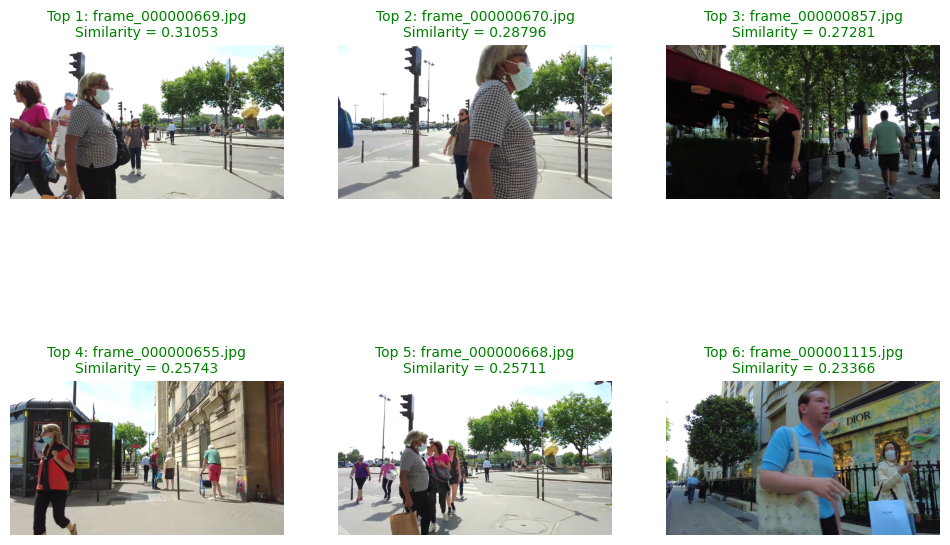

 2023-05-12 08:21:47 Powered by Azure Computer Vision Florence


,image_file,similarity
668,frames/frame_000000669.jpg,0.310535
669,frames/frame_000000670.jpg,0.287956
856,frames/frame_000000857.jpg,0.272807
654,frames/frame_000000655.jpg,0.257430
667,frames/frame_000000668.jpg,0.257108
...,...,...
1392,frames/frame_000001393.jpg,0.083215
40,frames/frame_000000041.jpg,0.082761
1058,frames/frame_000001059.jpg,0.082558
525,frames/frame_000000526.jpg,0.079814


In [28]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 2

In [29]:
query = "palais de tokyo"


Similar images using query = palais de tokyo


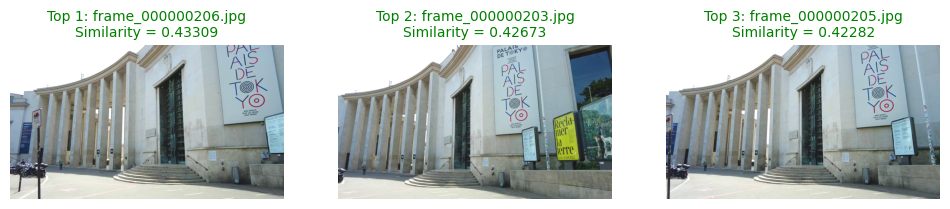

 2023-05-12 08:21:48 Powered by Azure Computer Vision Florence


,image_file,similarity
205,frames/frame_000000206.jpg,0.433086
202,frames/frame_000000203.jpg,0.426734
204,frames/frame_000000205.jpg,0.422815
213,frames/frame_000000214.jpg,0.417621
203,frames/frame_000000204.jpg,0.414793
...,...,...
991,frames/frame_000000992.jpg,0.092059
993,frames/frame_000000994.jpg,0.091445
19,frames/frame_000000020.jpg,0.087505
1013,frames/frame_000001014.jpg,0.082270


In [30]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 3

In [31]:
query = "person wearing an orange dress"


Similar images using query = person wearing an orange dress


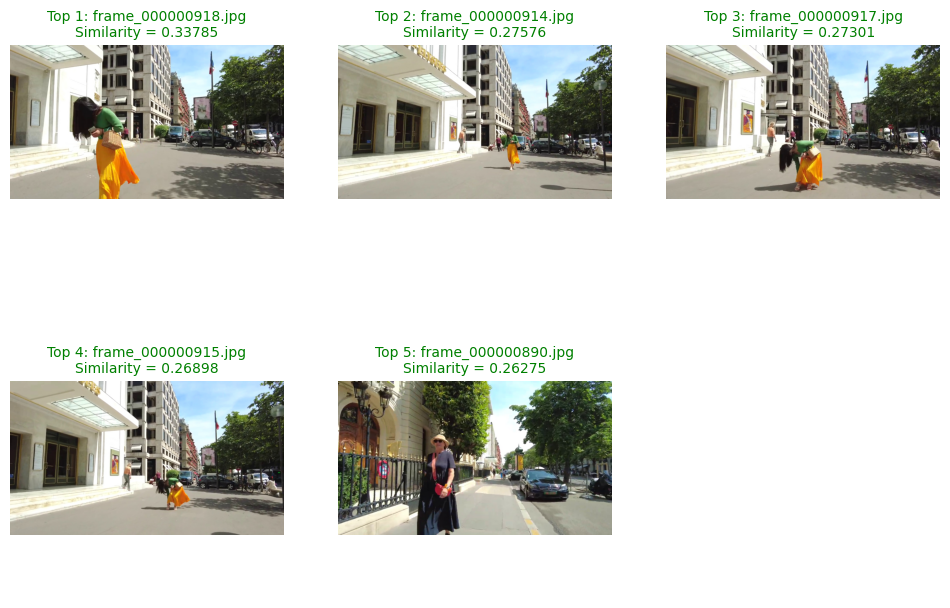

 2023-05-12 08:21:51 Powered by Azure Computer Vision Florence


,image_file,similarity
917,frames/frame_000000918.jpg,0.337848
913,frames/frame_000000914.jpg,0.275759
916,frames/frame_000000917.jpg,0.273010
914,frames/frame_000000915.jpg,0.268983
889,frames/frame_000000890.jpg,0.262751
...,...,...
194,frames/frame_000000195.jpg,0.074684
1120,frames/frame_000001121.jpg,0.074475
529,frames/frame_000000530.jpg,0.073312
50,frames/frame_000000051.jpg,0.073299


In [32]:
get_results_using_prompt(query, image_files, list_emb, topn=5, disp=False)

### Test 4

In [33]:
query = "eiffel tower"


Similar images using query = eiffel tower


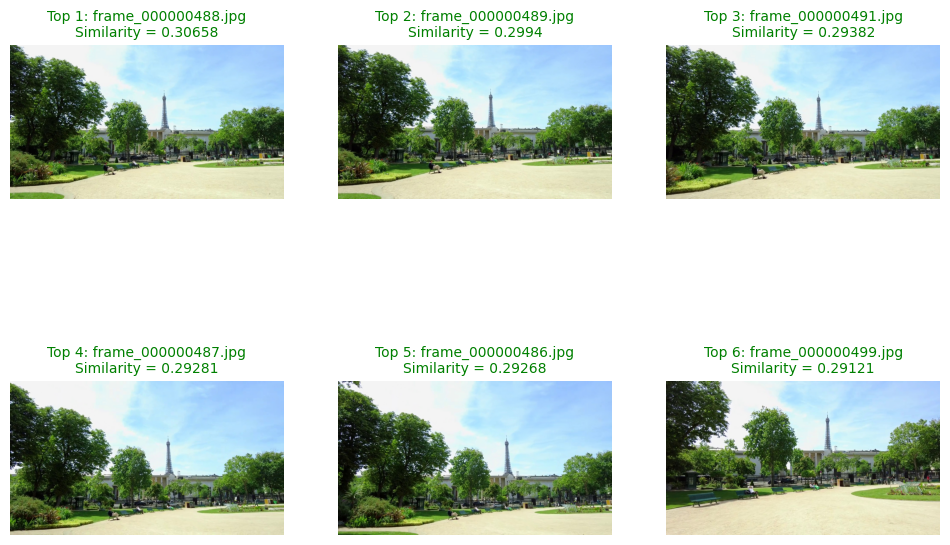

 2023-05-12 08:21:54 Powered by Azure Computer Vision Florence


,image_file,similarity
487,frames/frame_000000488.jpg,0.306579
488,frames/frame_000000489.jpg,0.299398
490,frames/frame_000000491.jpg,0.293819
486,frames/frame_000000487.jpg,0.292809
485,frames/frame_000000486.jpg,0.292676
...,...,...
1305,frames/frame_000001306.jpg,0.153390
932,frames/frame_000000933.jpg,0.153353
566,frames/frame_000000567.jpg,0.152603
934,frames/frame_000000935.jpg,0.151205


In [34]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 5

In [35]:
query = "monument with a golden flame"


Similar images using query = monument with a golden flame


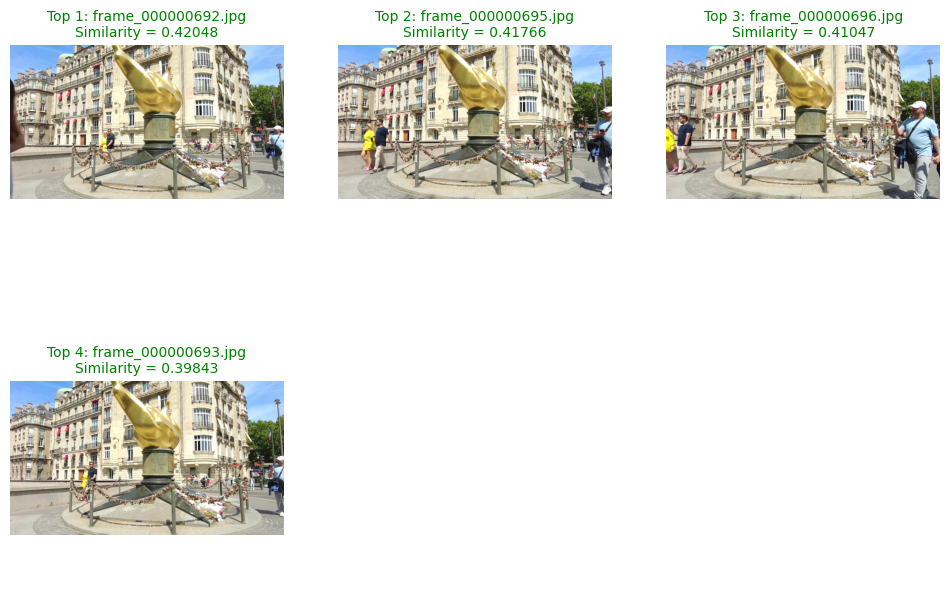

 2023-05-12 08:21:56 Powered by Azure Computer Vision Florence


,image_file,similarity
691,frames/frame_000000692.jpg,0.420477
694,frames/frame_000000695.jpg,0.417657
695,frames/frame_000000696.jpg,0.410474
692,frames/frame_000000693.jpg,0.398430
684,frames/frame_000000685.jpg,0.393864
...,...,...
26,frames/frame_000000027.jpg,0.080152
1179,frames/frame_000001180.jpg,0.078710
1294,frames/frame_000001295.jpg,0.078447
27,frames/frame_000000028.jpg,0.077907


In [36]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 6

In [37]:
query = "dior store"


Similar images using query = dior store


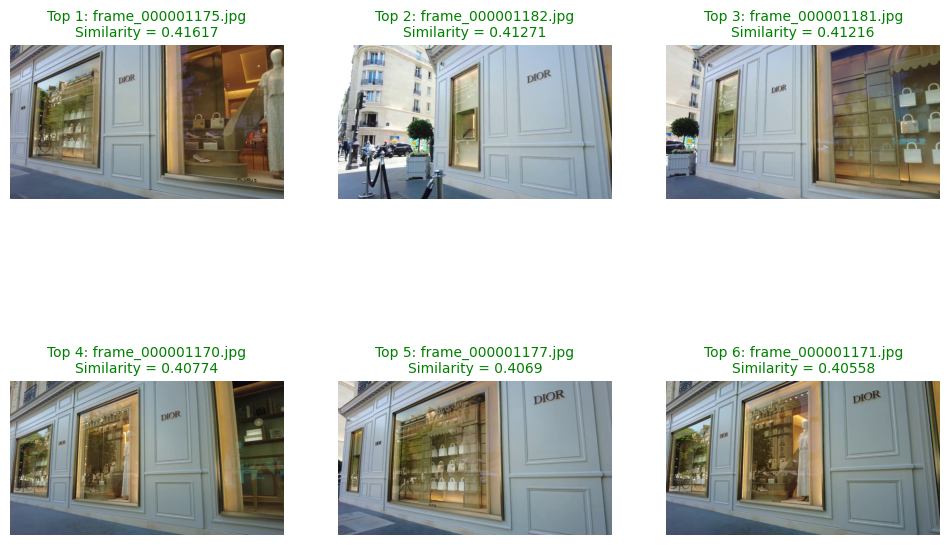

 2023-05-12 08:21:58 Powered by Azure Computer Vision Florence


,image_file,similarity
1174,frames/frame_000001175.jpg,0.416167
1181,frames/frame_000001182.jpg,0.412707
1180,frames/frame_000001181.jpg,0.412163
1169,frames/frame_000001170.jpg,0.407737
1176,frames/frame_000001177.jpg,0.406900
...,...,...
637,frames/frame_000000638.jpg,0.145649
836,frames/frame_000000837.jpg,0.143437
1051,frames/frame_000001052.jpg,0.138475
532,frames/frame_000000533.jpg,0.132038


In [38]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 7

In [39]:
query = "restaurant"


Similar images using query = restaurant


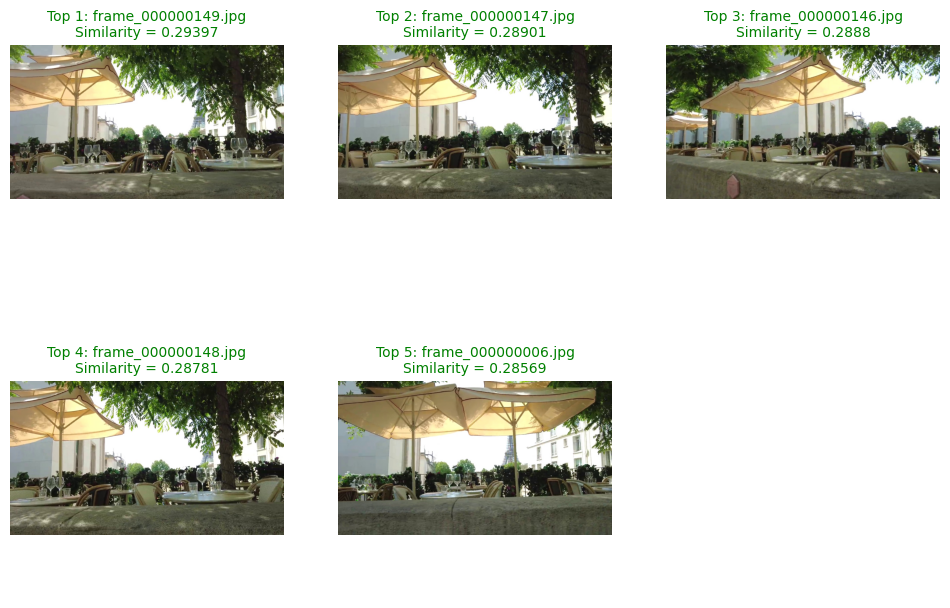

 2023-05-12 08:22:00 Powered by Azure Computer Vision Florence


,image_file,similarity
148,frames/frame_000000149.jpg,0.293971
146,frames/frame_000000147.jpg,0.289007
145,frames/frame_000000146.jpg,0.288801
147,frames/frame_000000148.jpg,0.287811
5,frames/frame_000000006.jpg,0.285685
...,...,...
1415,frames/frame_000001416.jpg,0.132247
637,frames/frame_000000638.jpg,0.132176
1418,frames/frame_000001419.jpg,0.131631
1419,frames/frame_000001420.jpg,0.131481


In [40]:
get_results_using_prompt(query, image_files, list_emb, topn=5, disp=False)

### Test 8

In [41]:
query = "garden"


Similar images using query = garden


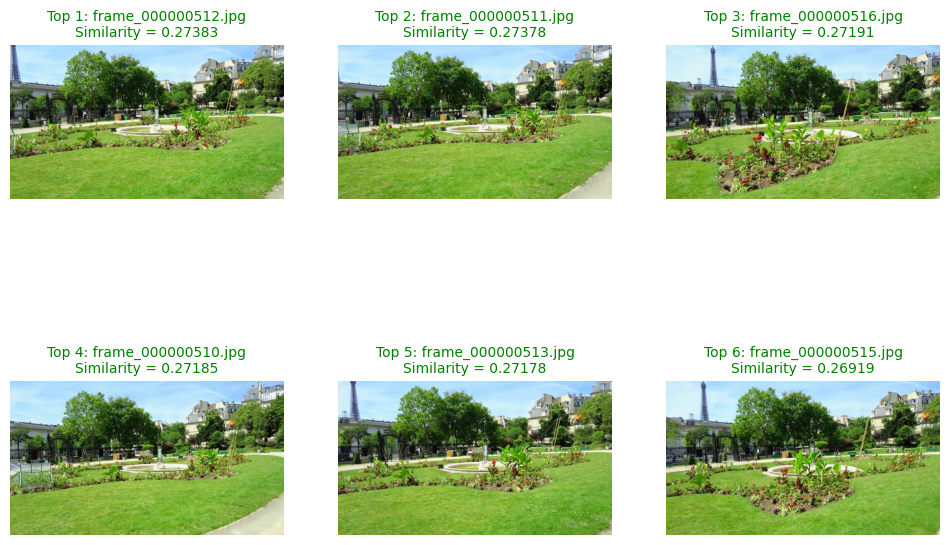

 2023-05-12 08:22:03 Powered by Azure Computer Vision Florence


,image_file,similarity
511,frames/frame_000000512.jpg,0.273834
510,frames/frame_000000511.jpg,0.273781
515,frames/frame_000000516.jpg,0.271908
509,frames/frame_000000510.jpg,0.271854
512,frames/frame_000000513.jpg,0.271779
...,...,...
1293,frames/frame_000001294.jpg,0.099658
1286,frames/frame_000001287.jpg,0.099574
1288,frames/frame_000001289.jpg,0.097962
27,frames/frame_000000028.jpg,0.095774


In [42]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 9

In [43]:
query = "busy street"

Top 6 images:

001 frames/frame_000000764.jpg with similarity index = 0.33090221850452395
002 frames/frame_000000766.jpg with similarity index = 0.3215711767597532
003 frames/frame_000000762.jpg with similarity index = 0.31981132649088917
004 frames/frame_000001351.jpg with similarity index = 0.3140722766468761
005 frames/frame_000000765.jpg with similarity index = 0.3128592747617
006 frames/frame_000000861.jpg with similarity index = 0.3122847041521851

Similar images using query = busy street


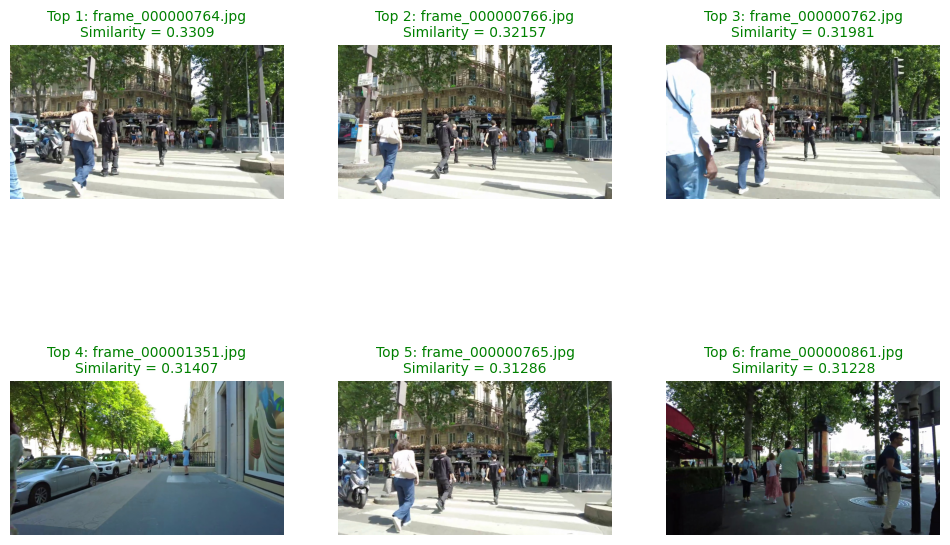

 2023-05-12 08:22:05 Powered by Azure Computer Vision Florence


,image_file,similarity
763,frames/frame_000000764.jpg,0.330902
765,frames/frame_000000766.jpg,0.321571
761,frames/frame_000000762.jpg,0.319811
1350,frames/frame_000001351.jpg,0.314072
764,frames/frame_000000765.jpg,0.312859
...,...,...
433,frames/frame_000000434.jpg,0.070968
424,frames/frame_000000425.jpg,0.070654
432,frames/frame_000000433.jpg,0.070463
430,frames/frame_000000431.jpg,0.066130


In [44]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=True)

### Test 10

In [45]:
query = "empty street"


Similar images using query = empty street


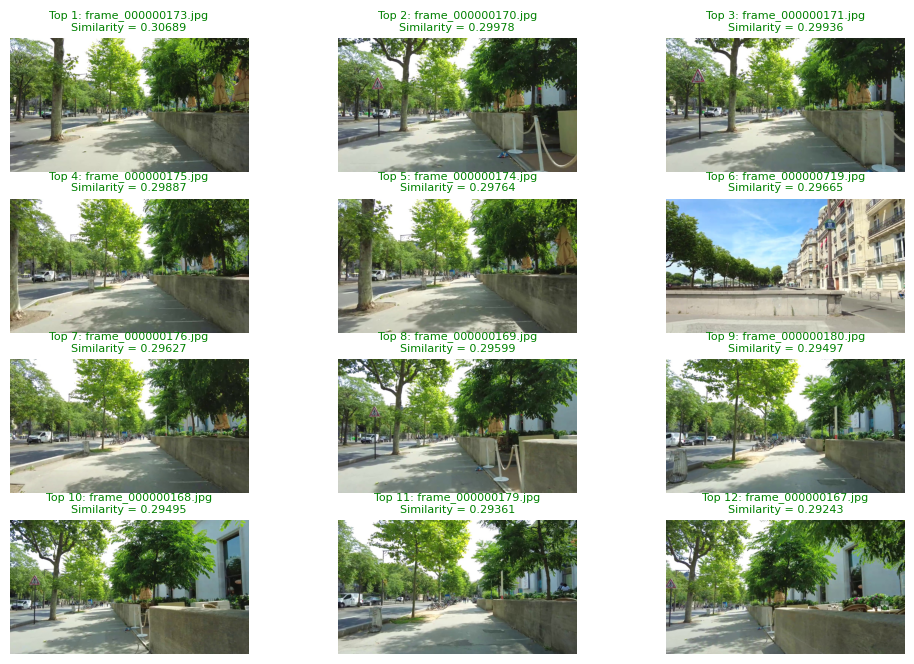

 2023-05-12 08:22:11 Powered by Azure Computer Vision Florence


,image_file,similarity
172,frames/frame_000000173.jpg,0.306894
169,frames/frame_000000170.jpg,0.299782
170,frames/frame_000000171.jpg,0.299356
174,frames/frame_000000175.jpg,0.298868
173,frames/frame_000000174.jpg,0.297637
...,...,...
313,frames/frame_000000314.jpg,0.126573
23,frames/frame_000000024.jpg,0.122871
1130,frames/frame_000001131.jpg,0.122322
1132,frames/frame_000001133.jpg,0.114614


In [46]:
get_results_using_prompt(query, image_files, list_emb, topn=12, disp=False)

> In the next notebook we will create a webapp with Gradio